## - Import

In [1]:
%matplotlib inline
import torch
import torch.nn as nn
import pandas as pd
import numpy as np
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from torch import autograd
from torch.autograd import Variable
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
from torchvision.datasets import ImageFolder
from tqdm import tqdm
import math
import torch.nn.functional as F
from sklearn.model_selection import train_test_split
import argparse
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR
import os
import sys

/home/hoge/.local/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import random
import numpy as np
import torch

def torch_fix_seed(seed=42):
    # Python random
    random.seed(seed)
    # Numpy
    np.random.seed(seed)
    # Pytorch
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.use_deterministic_algorithms = True


torch_fix_seed()

In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

print('torch version:',torch.__version__)
print('device:', device)

torch version: 1.11.0+cu113
device: cuda


## - Parameters

In [4]:
img_size = 64 # Image size
batch_size = 16  # Batch size

# Model
z_size = 100
ngf = 32
ndf = 64
generator_layer_size = [256, 512, 1024, 2048]
discriminator_layer_size = [2048, 1024, 512, 256]

# Training
epochs = 100 # Train epochs
learning_rate_G_g = 2e-5
learning_rate_G_c = 1e-5
learning_rate_D = 1e-5

## - Pytorch Dataset, DataLoader: Fashion MNIST

In [5]:
class_list = [chr(i + 65) for i in range(26)]
class_num = len(class_list)

In [6]:
class ImageTransform():
  def __init__(self, mean, std):
    self.data_transform = transforms.Compose([
    transforms.Grayscale(),
    transforms.ToTensor(),
    transforms.Resize((64, 64)),
    transforms.Normalize(mean, std)
    ])

  def __call__(self, img):
    return self.data_transform(img)

In [7]:
mean = (0.5,)
std = (0.5,)
images = ImageFolder( "../GoogleFonts/all", transform = ImageTransform(mean, std))
data_loader = DataLoader(images, batch_size = batch_size, shuffle = True, drop_last=True)

In [8]:
# print(dataset_GAN.X_train.shape)

# d = torch.from_numpy(dataset_GAN.X_train).float().clone()
# l = torch.from_numpy(dataset_GAN.y_train).long().clone()
# data_loader = zip(d, l)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


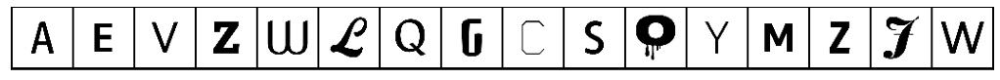

In [9]:
for images, labels in data_loader:
    fig, ax = plt.subplots(figsize=(18,10))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.imshow(make_grid(images, nrow=16).permute(1,2,0))
    break

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


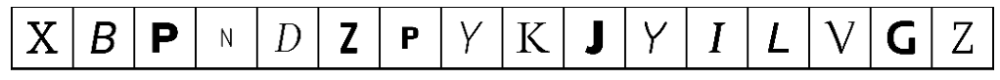

In [10]:
for images, labels in data_loader:
    fig, ax = plt.subplots(figsize=(18,10))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.imshow(make_grid(images, nrow=16).permute(1,2,0))
    break

In [11]:
def onehot_encode(label, n_class=26):  
    # ラベルをOne-Hoe形式に変換
    eye = torch.eye(n_class).to(device)
    # ランダムベクトルあるいは画像と連結するために(B, c_class, 1, 1)のTensorにして戻す
    return eye[label].view(-1, n_class, 1, 1)
    
def concat_image_label(image, label, n_class=26):
    # 画像とラベルを連結する
    oh_label = onehot_encode(label, n_class).to(device)       # ラベルをOne-Hot形式に変換
    oh_label = oh_label.expand(16, n_class, 64, 64)  # ラベルを画像サイズに拡大
    return torch.cat((image, oh_label), dim=1)    # 画像とラベルをチャネル方向（dim=1）で連結
 
def concat_noise_label(noise, label, n_class=26):
    # ランダムベクトルとラベルを連結する
    oh_label = onehot_encode(label, n_class).to(device)     # ラベルをOne-Hot形式に変換
    return torch.cat((noise, oh_label), dim=1)  # ランダムベクトルとラベルを連結

## - Generator

In [12]:
class Generator(nn.Module):
    def __init__(self, generator_layer_size, z_size, img_size, class_num):
        super().__init__()
        
        self.z_size = z_size
        self.img_size = img_size
        
        # self.label_emb = nn.Embedding(class_num, class_num)
        
        self.model = nn.Sequential(
            nn.ConvTranspose2d(self.z_size + 26, ngf * 32, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 32),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 32, ngf * 16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 16),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 16, ngf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 2, ngf, 3, 1, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf, 1, 3, 1, 1, bias=False),
            nn.Tanh()
        )
    
    def forward(self, z, labels):

        x = concat_noise_label(z, labels)

        out = self.model(x)
        
        return out

## - Discriminator

In [13]:
class Discriminator(nn.Module):
    def __init__(self, discriminator_layer_size, img_size, class_num):
        super().__init__()
        
        # self.label_emb = nn.Embedding(class_num, class_num)
        self.img_size = img_size
        
        self.model = nn.Sequential(
            nn.Conv2d(27, ndf, 3, 1, 1, bias=False),
            nn.BatchNorm2d(ndf),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 2, 3, 1, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 4, 3, 1, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, ndf * 8, 3, 1, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 8, 1, 0, bias=False),
            nn.Sigmoid()
        )
    
    def forward(self, x, labels):
        
        x = concat_image_label(x, labels)
        
        # Discriminator out
        out = self.model(x)
        
        return out.squeeze()

In [14]:
# Define generator
generator = Generator(generator_layer_size, z_size, img_size, class_num).to(device)
# Define discriminator
discriminator = Discriminator(discriminator_layer_size, img_size, class_num).to(device)

generator.load_state_dict(torch.load("generator.pth", map_location='cpu'))
discriminator.load_state_dict(torch.load("discriminator.pth", map_location='cpu'))

for param in discriminator.parameters():
    param.requires_grad = False

In [15]:
pretrained_model = "googlefonts.pth" #事前学習済みMNISTモデル(重みパラメータ)
class cNet(nn.Module):
    def __init__(self):
        super(cNet, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, 3, 1)
        self.conv2 = nn.Conv2d(32, 64, 3, 1)
        self.dropout1 = nn.Dropout(0.25)
        self.dropout2 = nn.Dropout(0.5)
        self.fc1 = nn.Linear(57600, 128)
        self.fc2 = nn.Linear(128, 26)

    def forward(self, x):
        x = self.conv1(x)
        x = F.relu(x)
        x = self.conv2(x)
        x = F.relu(x)
        x = F.max_pool2d(x, 2)
        x = self.dropout1(x)
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        x = F.relu(x)
        x = self.dropout2(x)
        x = self.fc2(x)
        output = F.log_softmax(x, dim=1)
        return output

# ネットワークの初期化
cmodel = cNet().to(device)
print(cmodel)
# 訓練済みモデルのロード
cmodel.load_state_dict(torch.load(pretrained_model, map_location='cpu'))

# モデルを評価モードに設定。本チュートリアルの例では、これはドロップアウト層等を評価モードにするのに必要
cmodel.eval()

for param in cmodel.parameters():
    param.requires_grad = False

cNet(
  (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1))
  (dropout1): Dropout(p=0.25, inplace=False)
  (dropout2): Dropout(p=0.5, inplace=False)
  (fc1): Linear(in_features=57600, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=26, bias=True)
)


In [16]:
def attack(data, data_grad, target, epsilon, lim):
    for i in range(1, 1001):
        data.requires_grad = False
        sign_data_grad = data_grad.sign()
        perturbed_data = data + epsilon * sign_data_grad
        perturbed_data = torch.clamp(perturbed_data, -1, 1)
        data = perturbed_data
        data.requires_grad = True
        output = cmodel(data)
        loss = F.nll_loss(output, target)
        pred = output.max(1, keepdim=True)[1]
        if pred.item() != target.item():
            break
        cmodel.zero_grad()
        loss.backward()
        data_grad = data.grad.data
    return data, pred, i

In [17]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, 3, 1)
        self.conv2 = nn.Conv2d(32, 64, 3, 1)
        self.dropout1 = nn.Dropout(0.25)
        self.dropout2 = nn.Dropout(0.5)
        self.fc1 = nn.Linear(57600, 128)
        self.fc2 = nn.Linear(128, 1)

    def forward(self, x):
        x = self.conv1(x)
        x = F.relu(x)
        x = self.conv2(x)
        x = F.relu(x)
        x = F.max_pool2d(x, 2)
        x = self.dropout1(x)
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        x = F.relu(x)
        x = self.dropout2(x)
        x = self.fc2(x)
        return x

## - Adversarial Learning of Generator & Discriminator

In [18]:
# Loss function
criterion = nn.BCELoss()
criterion_r = nn.MSELoss()

In [19]:
g_optimizer_g = torch.optim.Adam(generator.parameters(), lr=learning_rate_G_g)
g_optimizer_c = torch.optim.Adam(generator.parameters(), lr=learning_rate_G_c)
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=learning_rate_D)

In [20]:
def generator_train_step(batch_size, discriminator, generator, g_optimizer_g, g_optimizer_r, criterion, epoch):

    # Init gradient
    g_optimizer_g.zero_grad()
    g_optimizer_r.zero_grad()

    # Building z
    z = Variable(torch.randn(batch_size, z_size, 1, 1)).to(device)

    # Building fake labels
    fake_labels = Variable(torch.LongTensor(np.random.randint(0, class_num, batch_size))).to(device)

    # Generating fake images
    fake_images = generator(z, fake_labels)

    # Disciminating fake images
    validity = discriminator(fake_images, fake_labels)

    # Calculating discrimination loss (fake images)
    g_loss = criterion(validity, Variable(torch.ones(batch_size)).to(device))

            # データとラベルをデバイス（CPUもしくはGPU）に送信します
    data, target = fake_images.to(device), fake_labels.type(torch.LongTensor).to(device)
    
    # テンソルの requires_grad 属性を設定します。攻撃者にとっては重要な設定です。

#     data.requires_grad = True

    # データをモデルに順伝播させます
    output = cmodel(data)

    # 損失を計算します
    c_loss = F.nll_loss(output, target)

    loss = c_loss
    
    # Backword propagation
    loss.backward()

    #  Optimizing generator
    g_optimizer_c.step()

    return loss.squeeze().squeeze().data.cpu(), g_loss.data.cpu(), c_loss.squeeze().squeeze().data.cpu()

In [21]:
def discriminator_train_step(batch_size, discriminator, generator, d_optimizer, criterion, real_images, labels):
  # Init gradient 
  d_optimizer.zero_grad()

  # Disciminating real images
  real_validity = discriminator(real_images, labels)

  # Calculating discrimination loss (real images)
  real_loss = criterion(real_validity, Variable(torch.ones(batch_size)).to(device))

  # Building z
  z = Variable(torch.randn(batch_size, z_size, 1, 1)).to(device)

  # Building fake labels
  fake_labels = Variable(torch.LongTensor(np.random.randint(0, class_num, batch_size))).to(device)

  # Generating fake images
  fake_images = generator(z, fake_labels)

  # Disciminating fake images
  fake_validity = discriminator(fake_images, fake_labels)

  # Calculating discrimination loss (fake images)
  fake_loss = criterion(fake_validity, Variable(torch.zeros(batch_size)).to(device))

  # Sum two losses
  loss = real_loss + fake_loss

  # # Backword propagation
  # loss.backward()

  # # Optimizing discriminator
  # d_optimizer.step()

  return loss.data.cpu()

Starting epoch 1...


100%|██████████| 4116/4116 [03:09<00:00, 21.70it/s]


G_loss: 0.0057610622607171535, D_loss: 0.023966236039996147, g_loss: 10.307369232177734, c_loss: 0.0057610622607171535


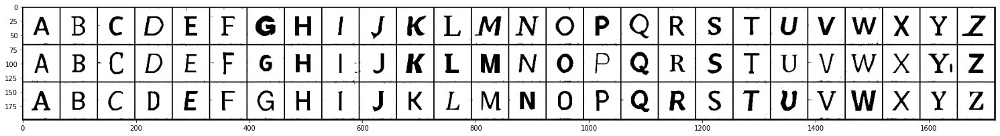

Starting epoch 2...


100%|██████████| 4116/4116 [03:03<00:00, 22.39it/s]


G_loss: 0.0003622005460783839, D_loss: 0.020796217024326324, g_loss: 11.835591316223145, c_loss: 0.0003622005460783839


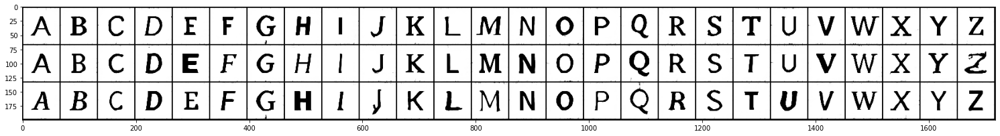

Starting epoch 3...


100%|██████████| 4116/4116 [03:03<00:00, 22.42it/s]


G_loss: 0.00011691138206515461, D_loss: 0.018723340705037117, g_loss: 13.051222801208496, c_loss: 0.00011691138206515461


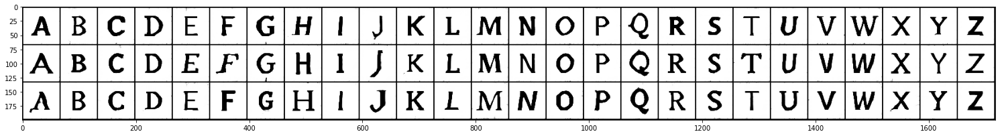

Starting epoch 4...


100%|██████████| 4116/4116 [03:04<00:00, 22.29it/s]


G_loss: 4.726822953671217e-05, D_loss: 0.021719271317124367, g_loss: 14.179606437683105, c_loss: 4.726822953671217e-05


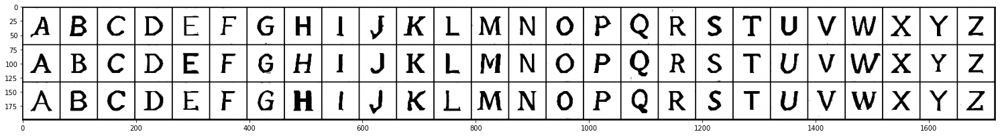

Starting epoch 5...


100%|██████████| 4116/4116 [03:00<00:00, 22.76it/s]


G_loss: 1.8323393305763602e-05, D_loss: 0.020058542490005493, g_loss: 15.20487117767334, c_loss: 1.8323393305763602e-05


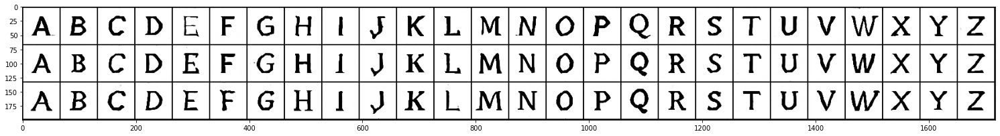

Starting epoch 6...


100%|██████████| 4116/4116 [03:07<00:00, 21.92it/s]


G_loss: 6.673463758488651e-06, D_loss: 0.022694028913974762, g_loss: 15.987464904785156, c_loss: 6.673463758488651e-06


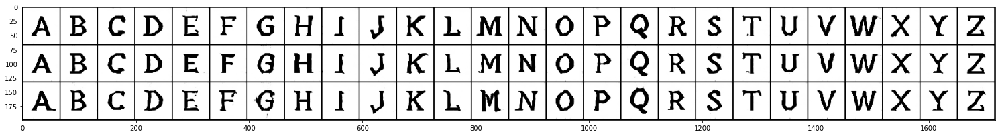

Starting epoch 7...


100%|██████████| 4116/4116 [03:02<00:00, 22.52it/s]


G_loss: 3.4704523841355694e-06, D_loss: 0.022266117855906487, g_loss: 16.06096076965332, c_loss: 3.4704523841355694e-06


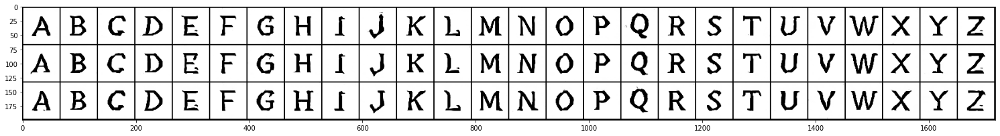

Starting epoch 8...


100%|██████████| 4116/4116 [03:03<00:00, 22.46it/s]


G_loss: 1.6965914255706593e-06, D_loss: 0.01779756136238575, g_loss: 16.770002365112305, c_loss: 1.6965914255706593e-06


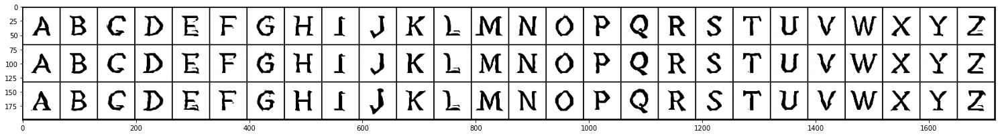

Starting epoch 9...


100%|██████████| 4116/4116 [03:03<00:00, 22.38it/s]


G_loss: 7.913965305306192e-07, D_loss: 0.020370110869407654, g_loss: 16.91572380065918, c_loss: 7.913965305306192e-07


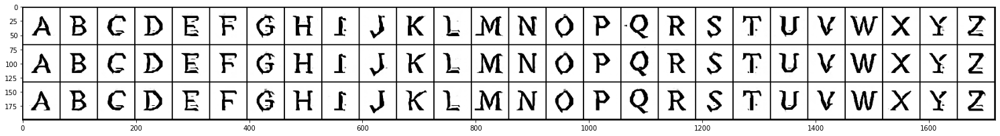

Starting epoch 10...


100%|██████████| 4116/4116 [03:59<00:00, 17.17it/s]


G_loss: 3.2719000842007517e-07, D_loss: 0.019220242276787758, g_loss: 17.190919876098633, c_loss: 3.2719000842007517e-07


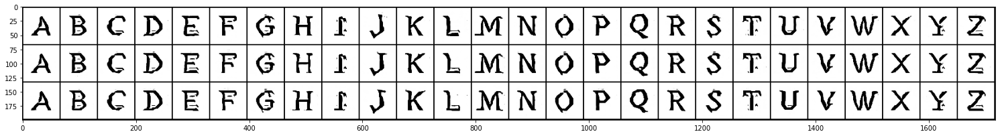

Starting epoch 11...


100%|██████████| 4116/4116 [02:57<00:00, 23.22it/s]


G_loss: 1.8724375649981084e-07, D_loss: 0.02071862481534481, g_loss: 17.488550186157227, c_loss: 1.8724375649981084e-07


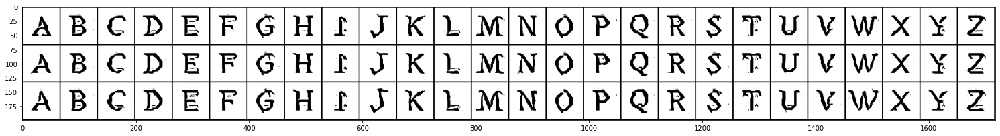

Starting epoch 12...


100%|██████████| 4116/4116 [03:15<00:00, 21.06it/s]


G_loss: 1.264390050437214e-07, D_loss: 0.02329012006521225, g_loss: 16.871173858642578, c_loss: 1.264390050437214e-07


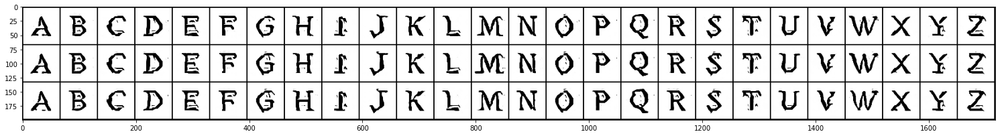

Starting epoch 13...


100%|██████████| 4116/4116 [02:56<00:00, 23.26it/s]


G_loss: 7.809351387777497e-08, D_loss: 0.01930905506014824, g_loss: 16.608440399169922, c_loss: 7.809351387777497e-08


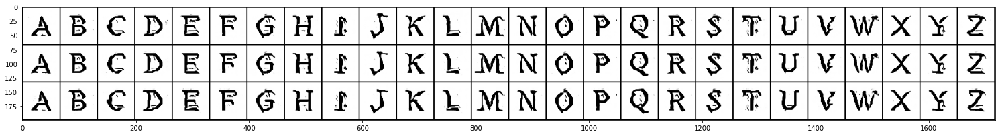

Starting epoch 14...


100%|██████████| 4116/4116 [03:08<00:00, 21.84it/s]


G_loss: 5.550464621251194e-08, D_loss: 0.019567573443055153, g_loss: 17.0582275390625, c_loss: 5.550464621251194e-08


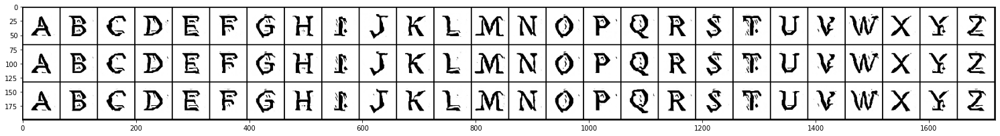

Starting epoch 15...


100%|██████████| 4116/4116 [02:56<00:00, 23.36it/s]


G_loss: 4.07247640055175e-08, D_loss: 0.02140459232032299, g_loss: 17.121652603149414, c_loss: 4.07247640055175e-08


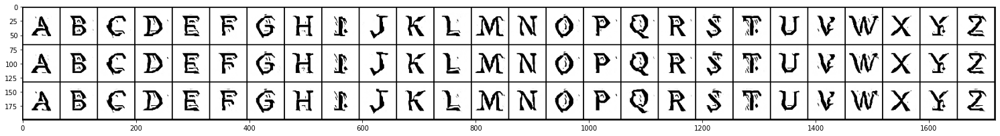

Starting epoch 16...


100%|██████████| 4116/4116 [02:56<00:00, 23.32it/s]


G_loss: 3.627541289574765e-08, D_loss: 0.019402410835027695, g_loss: 17.147727966308594, c_loss: 3.627541289574765e-08


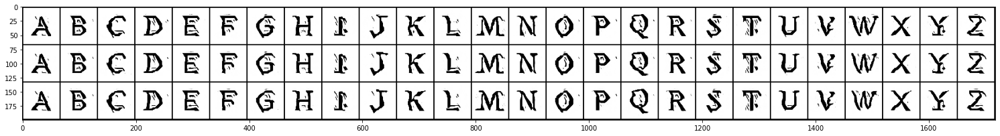

Starting epoch 17...


100%|██████████| 4116/4116 [02:55<00:00, 23.41it/s]


G_loss: 3.0785230364926974e-08, D_loss: 0.018472030758857727, g_loss: 17.583589553833008, c_loss: 3.0785230364926974e-08


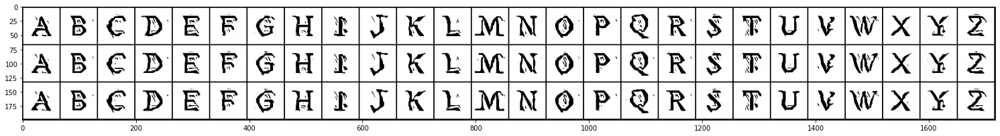

Starting epoch 18...


100%|██████████| 4116/4116 [03:03<00:00, 22.42it/s]


G_loss: 2.7036408667413525e-08, D_loss: 0.020028673112392426, g_loss: 17.993038177490234, c_loss: 2.7036408667413525e-08


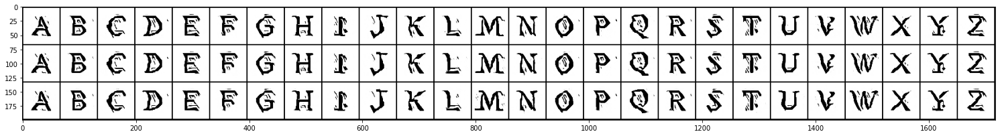

Starting epoch 19...


100%|██████████| 4116/4116 [03:10<00:00, 21.65it/s]


G_loss: 2.607521842890037e-08, D_loss: 0.019732950255274773, g_loss: 18.172740936279297, c_loss: 2.607521842890037e-08


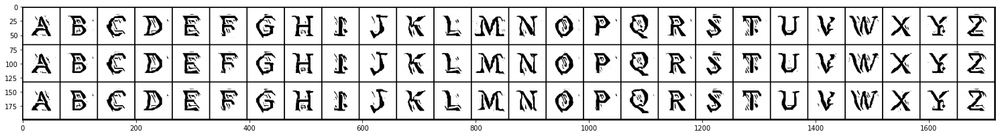

Starting epoch 20...


100%|██████████| 4116/4116 [02:56<00:00, 23.28it/s]


G_loss: 2.5352967725211784e-08, D_loss: 0.019189445301890373, g_loss: 17.892635345458984, c_loss: 2.5352967725211784e-08


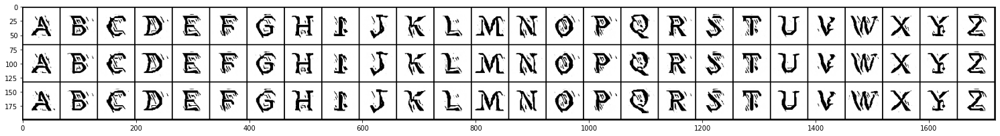

Starting epoch 21...


100%|██████████| 4116/4116 [02:58<00:00, 23.10it/s]


G_loss: 2.7025548021697432e-08, D_loss: 0.017411082983016968, g_loss: 17.66875648498535, c_loss: 2.7025548021697432e-08


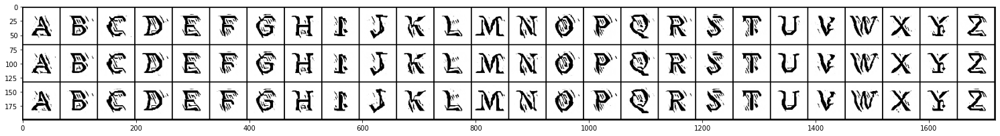

Starting epoch 22...


100%|██████████| 4116/4116 [02:55<00:00, 23.47it/s]


G_loss: 2.5881531584559525e-08, D_loss: 0.023232705891132355, g_loss: 17.38733673095703, c_loss: 2.5881531584559525e-08


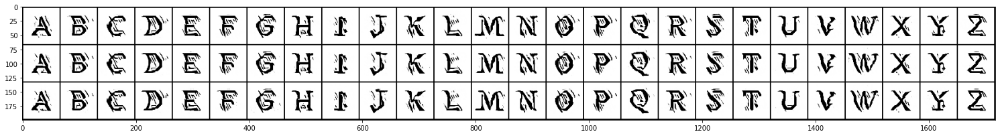

Starting epoch 23...


100%|██████████| 4116/4116 [02:55<00:00, 23.39it/s]


G_loss: 2.648069141741871e-08, D_loss: 0.019667919725179672, g_loss: 17.048925399780273, c_loss: 2.648069141741871e-08


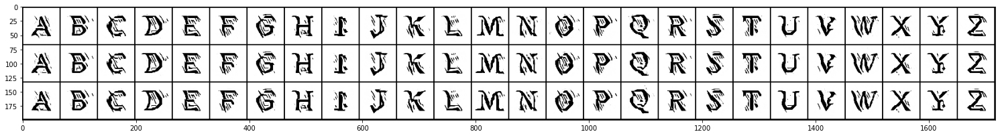

Starting epoch 24...


100%|██████████| 4116/4116 [03:00<00:00, 22.76it/s]


G_loss: 2.693504086437315e-08, D_loss: 0.020619859918951988, g_loss: 16.789247512817383, c_loss: 2.693504086437315e-08


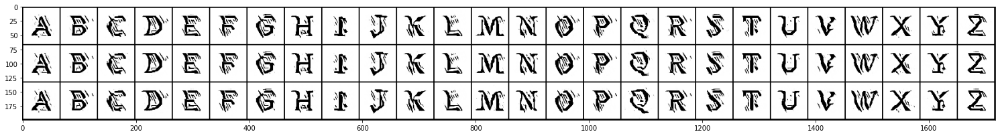

Starting epoch 25...


100%|██████████| 4116/4116 [02:57<00:00, 23.23it/s]


G_loss: 2.6813760101163098e-08, D_loss: 0.02027200348675251, g_loss: 16.558481216430664, c_loss: 2.6813760101163098e-08


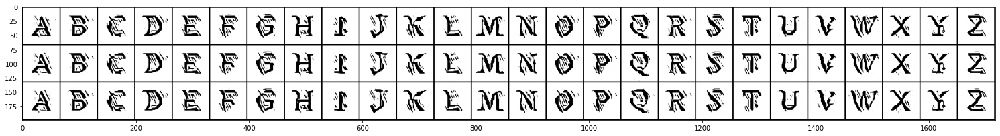

Starting epoch 26...


100%|██████████| 4116/4116 [03:00<00:00, 22.78it/s]


G_loss: 2.5830848571217757e-08, D_loss: 0.021131182089447975, g_loss: 16.354284286499023, c_loss: 2.5830848571217757e-08


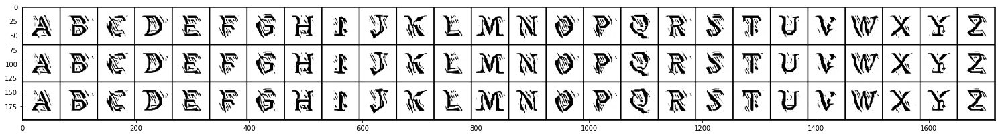

Starting epoch 27...


100%|██████████| 4116/4116 [02:57<00:00, 23.17it/s]


G_loss: 2.6509654915685132e-08, D_loss: 0.020777503028512, g_loss: 16.01805877685547, c_loss: 2.6509654915685132e-08


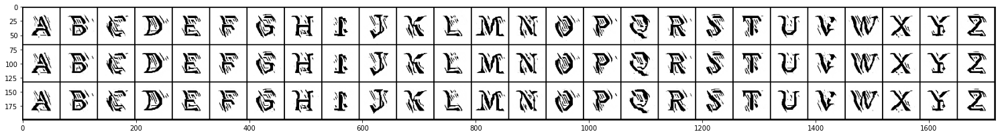

Starting epoch 28...


100%|██████████| 4116/4116 [03:03<00:00, 22.47it/s]


G_loss: 2.627795581133796e-08, D_loss: 0.020652571693062782, g_loss: 15.948182106018066, c_loss: 2.627795581133796e-08


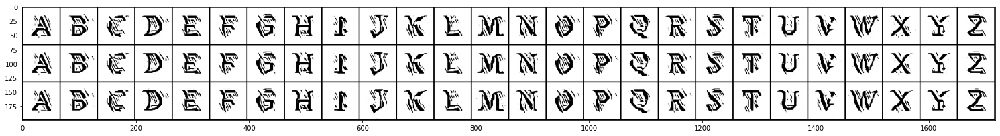

Starting epoch 29...


100%|██████████| 4116/4116 [03:04<00:00, 22.36it/s]


G_loss: 2.579464464247394e-08, D_loss: 0.019231364130973816, g_loss: 15.744573593139648, c_loss: 2.579464464247394e-08


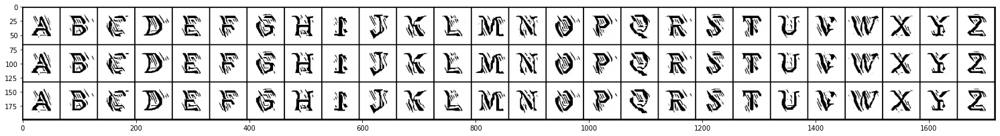

Starting epoch 30...


100%|██████████| 4116/4116 [03:00<00:00, 22.80it/s]


G_loss: 2.729344927843158e-08, D_loss: 0.020711328834295273, g_loss: 15.58378791809082, c_loss: 2.729344927843158e-08


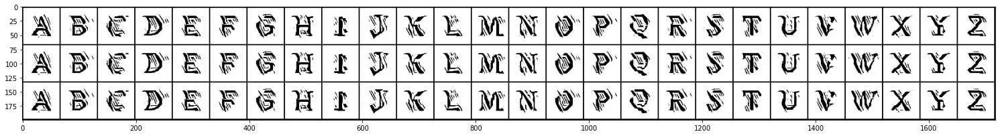

Starting epoch 31...


100%|██████████| 4116/4116 [02:59<00:00, 22.96it/s]


G_loss: 2.745274230164796e-08, D_loss: 0.020477421581745148, g_loss: 15.516328811645508, c_loss: 2.745274230164796e-08


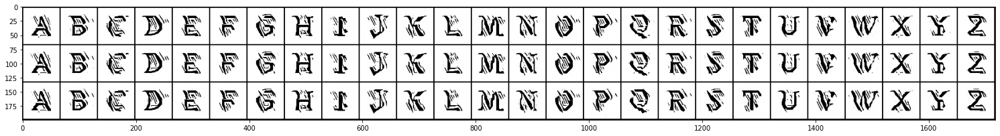

Starting epoch 32...


100%|██████████| 4116/4116 [03:02<00:00, 22.58it/s]


G_loss: 2.7351374498607584e-08, D_loss: 0.02081340365111828, g_loss: 15.706584930419922, c_loss: 2.7351374498607584e-08


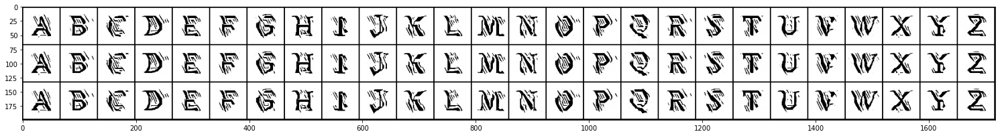

Starting epoch 33...


100%|██████████| 4116/4116 [03:04<00:00, 22.32it/s]


G_loss: 2.8225677795035153e-08, D_loss: 0.019788328558206558, g_loss: 15.433589935302734, c_loss: 2.8225677795035153e-08


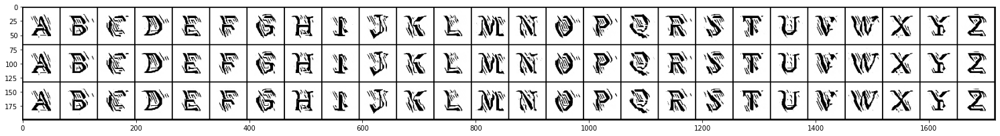

Starting epoch 34...


100%|██████████| 4116/4116 [03:04<00:00, 22.35it/s]


G_loss: 2.8629340675934145e-08, D_loss: 0.018999341875314713, g_loss: 15.446690559387207, c_loss: 2.8629340675934145e-08


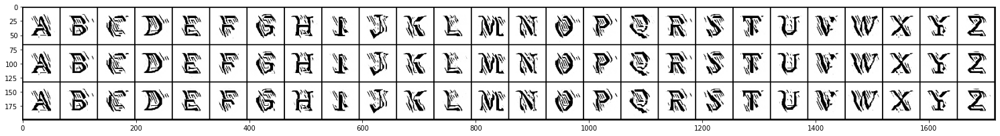

Starting epoch 35...


100%|██████████| 4116/4116 [03:11<00:00, 21.47it/s]


G_loss: 2.8569605348138793e-08, D_loss: 0.02162451297044754, g_loss: 15.17819595336914, c_loss: 2.8569605348138793e-08


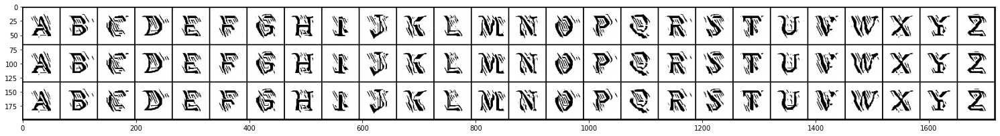

Starting epoch 36...


100%|██████████| 4116/4116 [03:04<00:00, 22.30it/s]


G_loss: 2.9304526805162823e-08, D_loss: 0.02077375538647175, g_loss: 14.71679401397705, c_loss: 2.9304526805162823e-08


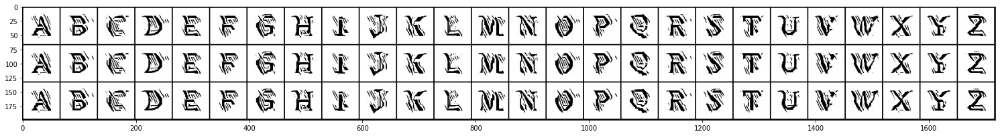

Starting epoch 37...


100%|██████████| 4116/4116 [03:02<00:00, 22.55it/s]


G_loss: 3.001591508677848e-08, D_loss: 0.020629238337278366, g_loss: 14.330495834350586, c_loss: 3.001591508677848e-08


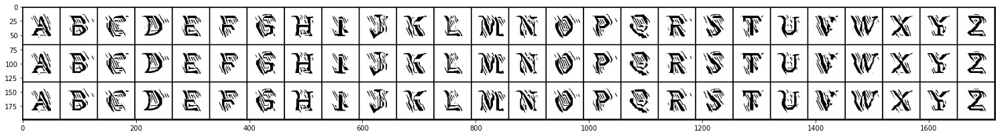

Starting epoch 38...


100%|██████████| 4116/4116 [03:01<00:00, 22.68it/s]


G_loss: 2.969913737160823e-08, D_loss: 0.02178148739039898, g_loss: 14.012763023376465, c_loss: 2.969913737160823e-08


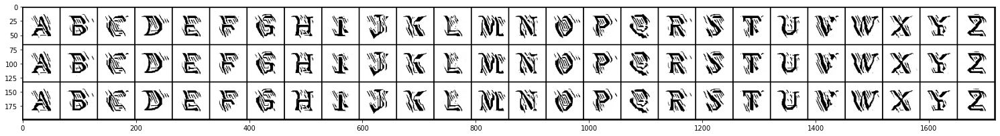

Starting epoch 39...


100%|██████████| 4116/4116 [02:59<00:00, 22.92it/s]


G_loss: 2.971181167765735e-08, D_loss: 0.019919728860259056, g_loss: 13.682976722717285, c_loss: 2.971181167765735e-08


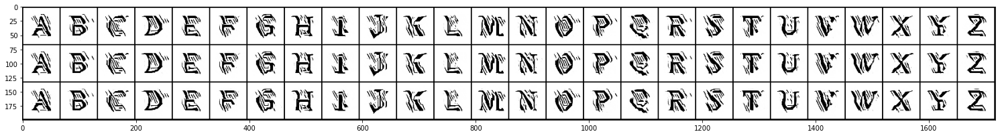

Starting epoch 40...


100%|██████████| 4116/4116 [03:12<00:00, 21.40it/s]


G_loss: 2.8895433601405784e-08, D_loss: 0.020144281908869743, g_loss: 13.555121421813965, c_loss: 2.8895433601405784e-08


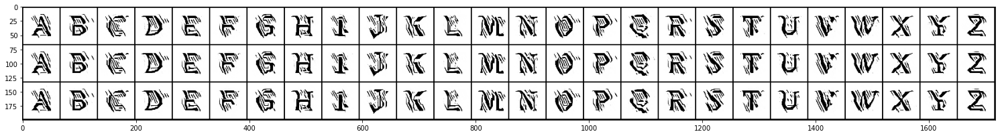

Starting epoch 41...


100%|██████████| 4116/4116 [03:02<00:00, 22.51it/s]


G_loss: 2.816775257485915e-08, D_loss: 0.01906413584947586, g_loss: 13.436854362487793, c_loss: 2.816775257485915e-08


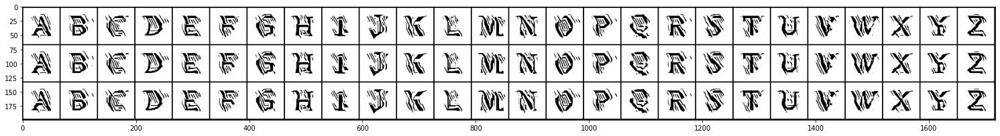

Starting epoch 42...


100%|██████████| 4116/4116 [03:05<00:00, 22.18it/s]


G_loss: 2.7907091748602397e-08, D_loss: 0.021609928458929062, g_loss: 13.093878746032715, c_loss: 2.7907091748602397e-08


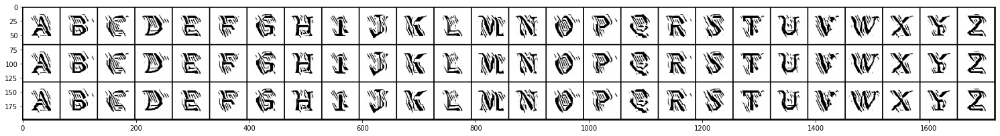

Starting epoch 43...


100%|██████████| 4116/4116 [03:05<00:00, 22.17it/s]


G_loss: 2.8100776816586404e-08, D_loss: 0.020106986165046692, g_loss: 12.997387886047363, c_loss: 2.8100776816586404e-08


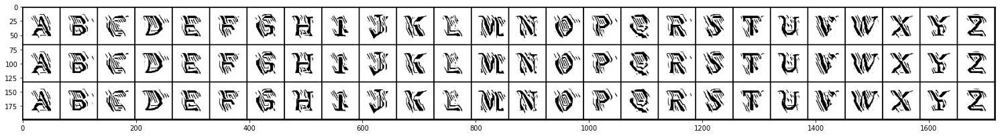

Starting epoch 44...


100%|██████████| 4116/4116 [03:09<00:00, 21.72it/s]


G_loss: 2.7955964654324816e-08, D_loss: 0.024905139580368996, g_loss: 12.886693954467773, c_loss: 2.7955964654324816e-08


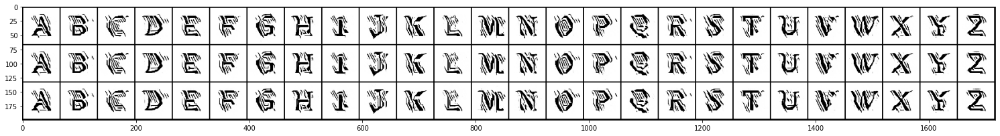

Starting epoch 45...


100%|██████████| 4116/4116 [03:08<00:00, 21.86it/s]


G_loss: 2.7087093457112132e-08, D_loss: 0.01944592595100403, g_loss: 13.042949676513672, c_loss: 2.7087093457112132e-08


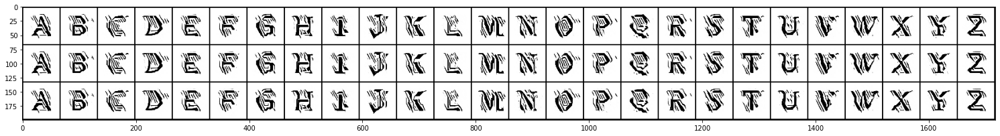

Starting epoch 46...


100%|██████████| 4116/4116 [03:12<00:00, 21.43it/s]


G_loss: 2.666894793890151e-08, D_loss: 0.020117418840527534, g_loss: 13.019882202148438, c_loss: 2.666894793890151e-08


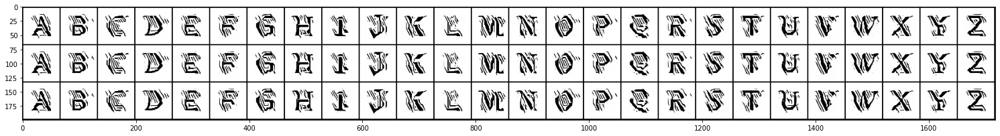

Starting epoch 47...


100%|██████████| 4116/4116 [03:01<00:00, 22.68it/s]


G_loss: 2.6129523433837676e-08, D_loss: 0.022728990763425827, g_loss: 13.015556335449219, c_loss: 2.6129523433837676e-08


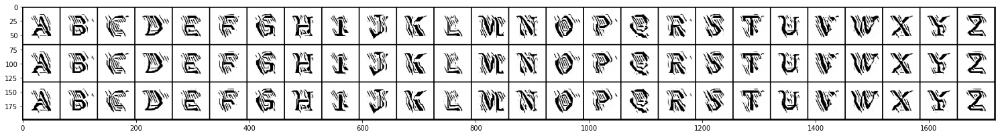

Starting epoch 48...


100%|██████████| 4116/4116 [03:01<00:00, 22.66it/s]


G_loss: 2.560638989734798e-08, D_loss: 0.020090864971280098, g_loss: 12.84195613861084, c_loss: 2.560638989734798e-08


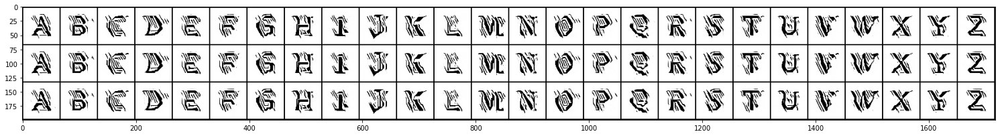

Starting epoch 49...


100%|██████████| 4116/4116 [02:59<00:00, 22.93it/s]


G_loss: 2.6493363947110993e-08, D_loss: 0.01750924438238144, g_loss: 12.392125129699707, c_loss: 2.6493363947110993e-08


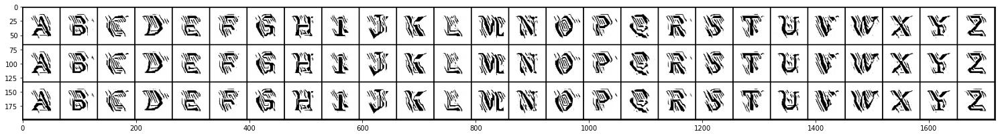

Starting epoch 50...


100%|██████████| 4116/4116 [03:02<00:00, 22.61it/s]


G_loss: 2.6705150091288488e-08, D_loss: 0.02475598081946373, g_loss: 11.714361190795898, c_loss: 2.6705150091288488e-08


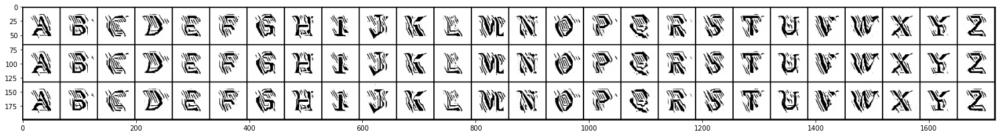

Starting epoch 51...


100%|██████████| 4116/4116 [03:00<00:00, 22.76it/s]


G_loss: 2.7173980399197717e-08, D_loss: 0.020312003791332245, g_loss: 11.28348445892334, c_loss: 2.7173980399197717e-08


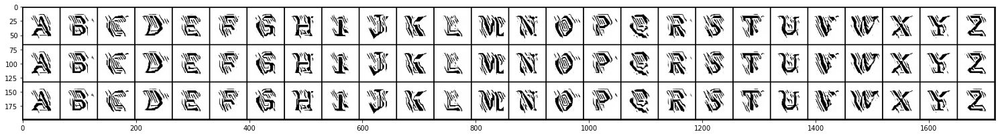

Starting epoch 52...


100%|██████████| 4116/4116 [03:02<00:00, 22.54it/s]


G_loss: 2.7588503925812802e-08, D_loss: 0.02250291407108307, g_loss: 10.974261283874512, c_loss: 2.7588503925812802e-08


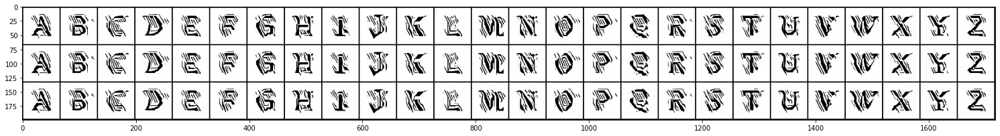

Starting epoch 53...


100%|██████████| 4116/4116 [03:03<00:00, 22.47it/s]


G_loss: 2.829446366092725e-08, D_loss: 0.02042105607688427, g_loss: 10.878438949584961, c_loss: 2.829446366092725e-08


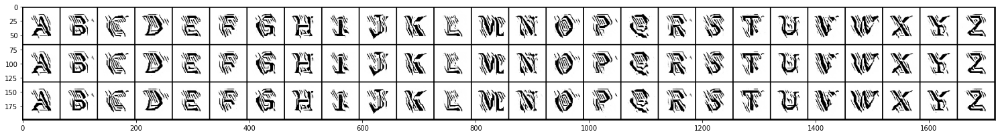

Starting epoch 54...


100%|██████████| 4116/4116 [03:12<00:00, 21.36it/s]


G_loss: 2.8946118391104392e-08, D_loss: 0.019008200615644455, g_loss: 10.736246109008789, c_loss: 2.8946118391104392e-08


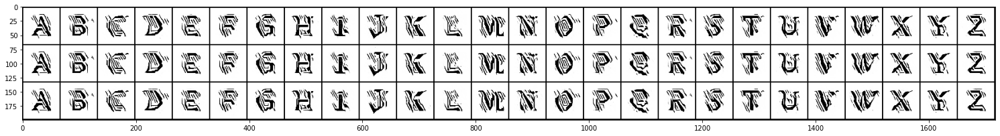

Starting epoch 55...


100%|██████████| 4116/4116 [03:13<00:00, 21.25it/s]


G_loss: 2.862210024545675e-08, D_loss: 0.017932528629899025, g_loss: 10.625967025756836, c_loss: 2.862210024545675e-08


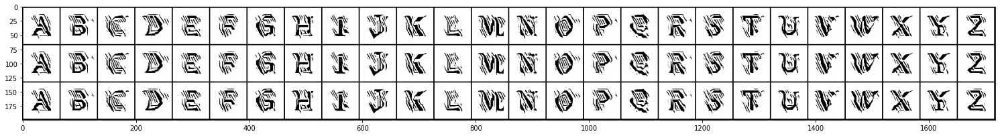

Starting epoch 56...


100%|██████████| 4116/4116 [03:17<00:00, 20.82it/s]


G_loss: 2.705994006646506e-08, D_loss: 0.022502316161990166, g_loss: 10.5400972366333, c_loss: 2.705994006646506e-08


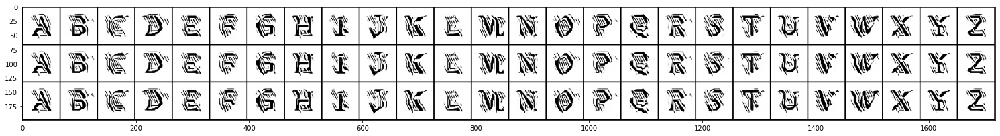

Starting epoch 57...


100%|██████████| 4116/4116 [03:14<00:00, 21.22it/s]


G_loss: 2.634312146199136e-08, D_loss: 0.023387230932712555, g_loss: 10.401787757873535, c_loss: 2.634312146199136e-08


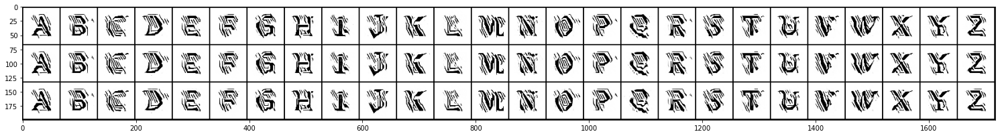

Starting epoch 58...


100%|██████████| 4116/4116 [03:19<00:00, 20.62it/s]


G_loss: 2.5805505288190034e-08, D_loss: 0.020264020189642906, g_loss: 10.596726417541504, c_loss: 2.5805505288190034e-08


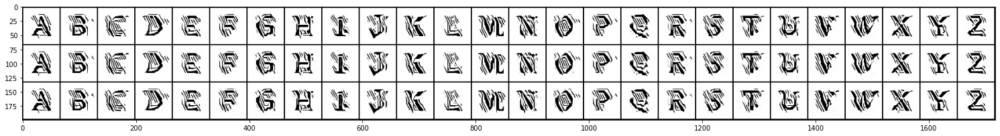

Starting epoch 59...


100%|██████████| 4116/4116 [03:10<00:00, 21.60it/s]


G_loss: 2.6165725586224653e-08, D_loss: 0.0249697994440794, g_loss: 10.752748489379883, c_loss: 2.6165725586224653e-08


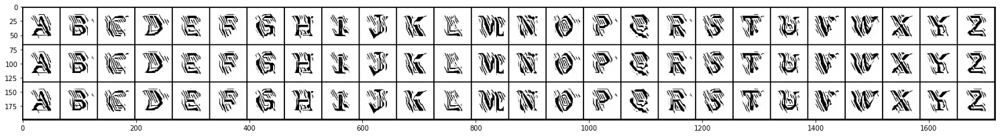

Starting epoch 60...


100%|██████████| 4116/4116 [03:21<00:00, 20.40it/s]


G_loss: 2.7735126195693738e-08, D_loss: 0.01989099197089672, g_loss: 10.670392036437988, c_loss: 2.7735126195693738e-08


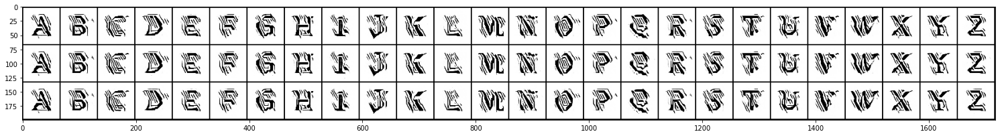

Starting epoch 61...


100%|██████████| 4116/4116 [03:17<00:00, 20.82it/s]


G_loss: 2.874881133152485e-08, D_loss: 0.019807463511824608, g_loss: 10.505623817443848, c_loss: 2.874881133152485e-08


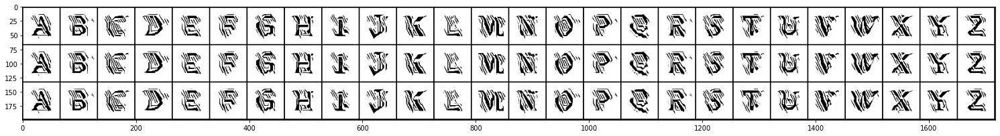

Starting epoch 62...


100%|██████████| 4116/4116 [03:17<00:00, 20.82it/s]


G_loss: 2.924479325372431e-08, D_loss: 0.01868707500398159, g_loss: 10.316510200500488, c_loss: 2.924479325372431e-08


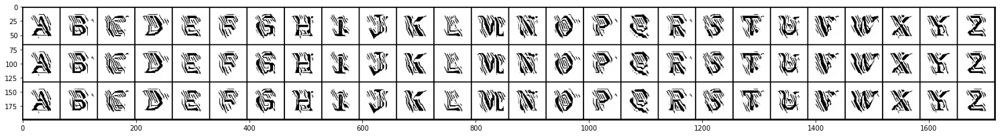

Starting epoch 63...


100%|██████████| 4116/4116 [03:16<00:00, 20.90it/s]


G_loss: 2.941856713789548e-08, D_loss: 0.02220260351896286, g_loss: 10.191547393798828, c_loss: 2.941856713789548e-08


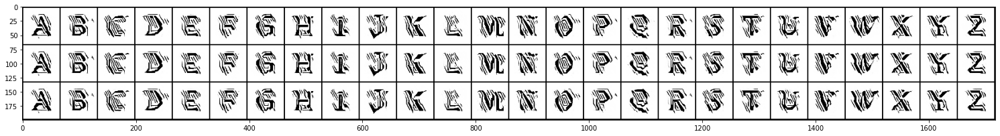

Starting epoch 64...


100%|██████████| 4116/4116 [03:15<00:00, 21.02it/s]


G_loss: 2.9069207485576953e-08, D_loss: 0.022140564396977425, g_loss: 10.143404006958008, c_loss: 2.9069207485576953e-08


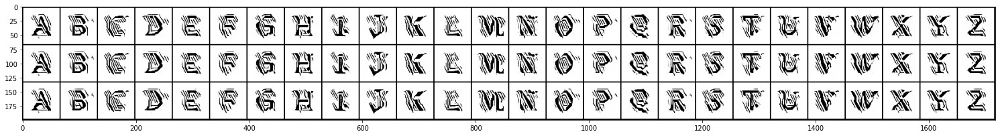

Starting epoch 65...


100%|██████████| 4116/4116 [03:20<00:00, 20.57it/s]


G_loss: 2.8956979036820485e-08, D_loss: 0.020751552656292915, g_loss: 9.919703483581543, c_loss: 2.8956979036820485e-08


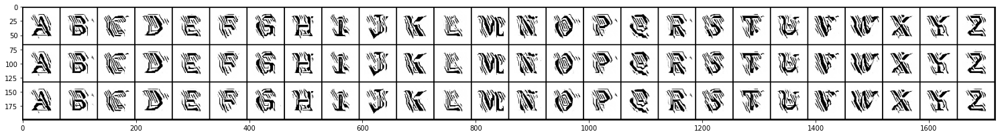

Starting epoch 66...


100%|██████████| 4116/4116 [03:16<00:00, 21.00it/s]


G_loss: 2.9023954795093232e-08, D_loss: 0.016276497393846512, g_loss: 9.665413856506348, c_loss: 2.9023954795093232e-08


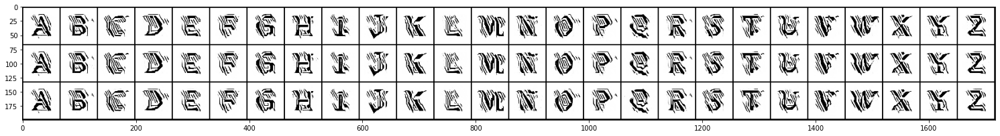

Starting epoch 67...


100%|██████████| 4116/4116 [03:17<00:00, 20.87it/s]


G_loss: 2.9425807568372875e-08, D_loss: 0.02096397988498211, g_loss: 9.591082572937012, c_loss: 2.9425807568372875e-08


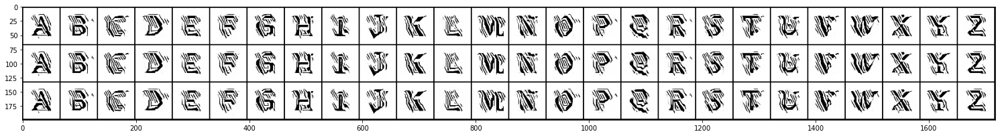

Starting epoch 68...


100%|██████████| 4116/4116 [03:18<00:00, 20.75it/s]


G_loss: 2.9442098536947015e-08, D_loss: 0.02083558402955532, g_loss: 9.565292358398438, c_loss: 2.9442098536947015e-08


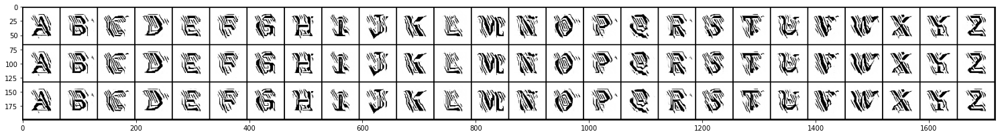

Starting epoch 69...


100%|██████████| 4116/4116 [03:16<00:00, 20.89it/s]


G_loss: 2.9241171262128773e-08, D_loss: 0.020689846947789192, g_loss: 9.488101959228516, c_loss: 2.9241171262128773e-08


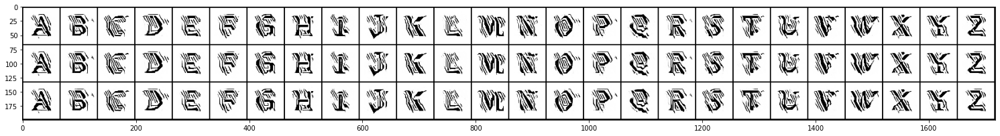

Starting epoch 70...


100%|██████████| 4116/4116 [03:16<00:00, 20.98it/s]


G_loss: 2.9284615621349985e-08, D_loss: 0.02398676797747612, g_loss: 9.313764572143555, c_loss: 2.9284615621349985e-08


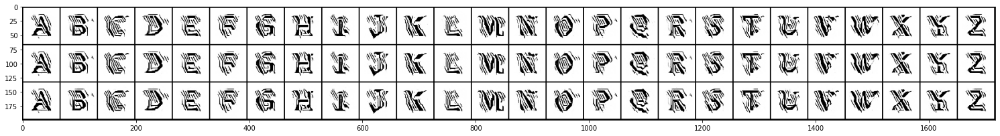

Starting epoch 71...


100%|██████████| 4116/4116 [03:15<00:00, 21.01it/s]


G_loss: 2.9125322598133607e-08, D_loss: 0.022756725549697876, g_loss: 9.3571138381958, c_loss: 2.9125322598133607e-08


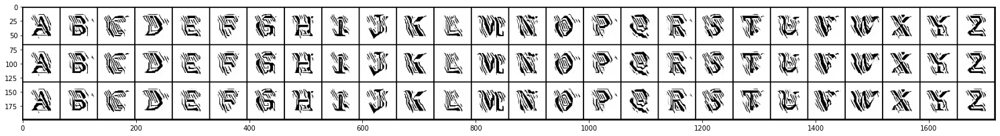

Starting epoch 72...


100%|██████████| 4116/4116 [03:16<00:00, 20.94it/s]


G_loss: 2.9554328762060322e-08, D_loss: 0.022132493555545807, g_loss: 9.499625205993652, c_loss: 2.9554328762060322e-08


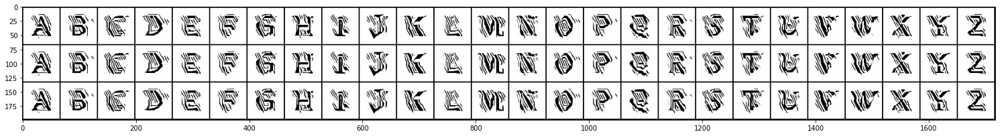

Starting epoch 73...


100%|██████████| 4116/4116 [03:16<00:00, 20.97it/s]


G_loss: 2.9547088331582927e-08, D_loss: 0.022623270750045776, g_loss: 9.453889846801758, c_loss: 2.9547088331582927e-08


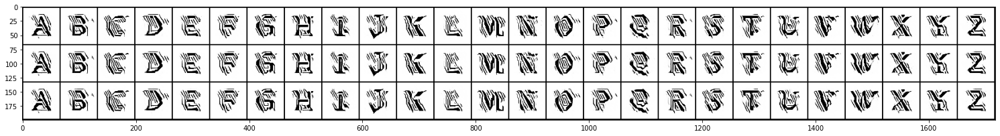

Starting epoch 74...


100%|██████████| 4116/4116 [03:20<00:00, 20.52it/s]


G_loss: 2.9615874197475023e-08, D_loss: 0.019483324140310287, g_loss: 9.489018440246582, c_loss: 2.9615874197475023e-08


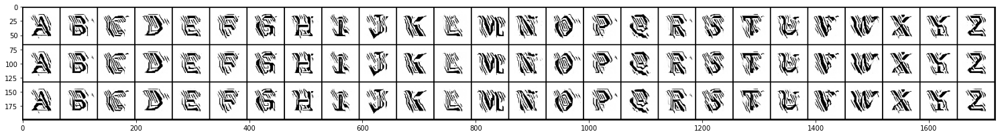

Starting epoch 75...


100%|██████████| 4116/4116 [03:17<00:00, 20.89it/s]


G_loss: 2.9738963291947584e-08, D_loss: 0.020453976467251778, g_loss: 9.53650188446045, c_loss: 2.9738963291947584e-08


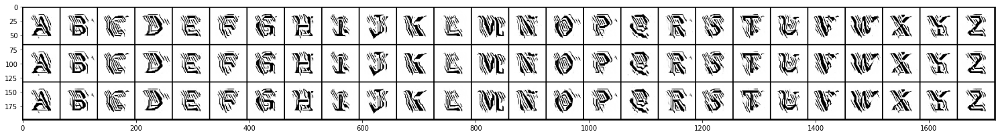

Starting epoch 76...


100%|██████████| 4116/4116 [03:17<00:00, 20.89it/s]


G_loss: 2.9719052108134747e-08, D_loss: 0.020757075399160385, g_loss: 9.440567016601562, c_loss: 2.9719052108134747e-08


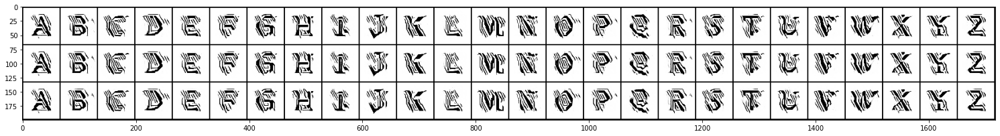

Starting epoch 77...


100%|██████████| 4116/4116 [03:15<00:00, 21.04it/s]


G_loss: 2.999962589456118e-08, D_loss: 0.01977788843214512, g_loss: 9.50040340423584, c_loss: 2.999962589456118e-08


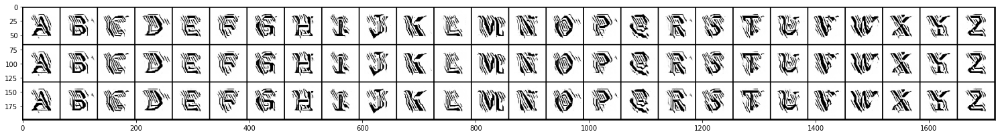

Starting epoch 78...


100%|██████████| 4116/4116 [03:16<00:00, 20.95it/s]


G_loss: 2.9990573580107593e-08, D_loss: 0.020180178806185722, g_loss: 9.470176696777344, c_loss: 2.9990573580107593e-08


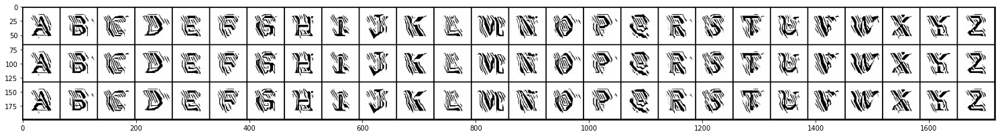

Starting epoch 79...


100%|██████████| 4116/4116 [03:19<00:00, 20.58it/s]


G_loss: 3.0283818119869466e-08, D_loss: 0.02351028472185135, g_loss: 9.481258392333984, c_loss: 3.0283818119869466e-08


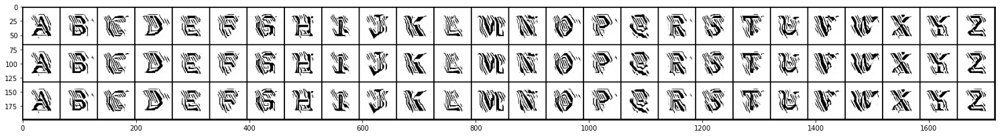

Starting epoch 80...


100%|██████████| 4116/4116 [03:17<00:00, 20.81it/s]


G_loss: 3.026209682843728e-08, D_loss: 0.021811891347169876, g_loss: 9.575089454650879, c_loss: 3.026209682843728e-08


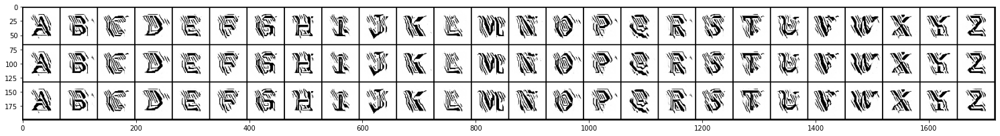

Starting epoch 81...


100%|██████████| 4116/4116 [03:19<00:00, 20.60it/s]


G_loss: 3.0596975619801015e-08, D_loss: 0.022806989029049873, g_loss: 9.607598304748535, c_loss: 3.0596975619801015e-08


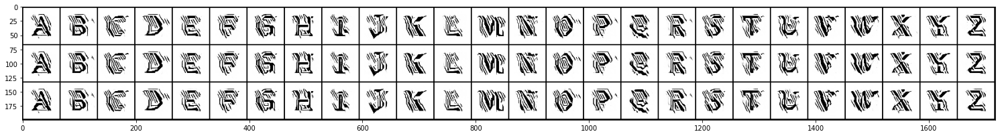

Starting epoch 82...


  3%|▎         | 114/4116 [00:05<03:01, 22.04it/s]

In [22]:
history = []
for epoch in range(epochs):
    print('Starting epoch {}...'.format(epoch+1))
    G_losses, D_losses, g_losses, c_losses = [], [], [], []

    for images, labels in tqdm(data_loader):
        # Train data
        real_images = Variable(images).to(device)
        labels = Variable(labels).to(device)

        # Set generator train
        generator.train()

        # Train discriminator
        d_loss = discriminator_train_step(len(real_images), discriminator,
                                          generator, d_optimizer, criterion,
                                          real_images, labels)
        
        # Train generator
        G_loss, g_loss, c_loss = generator_train_step(batch_size, discriminator, generator, g_optimizer_g, g_optimizer_c, criterion, epoch)

        G_losses.append(G_loss)
        D_losses.append(d_loss)
        g_losses.append(g_loss)
        c_losses.append(c_loss)
    
   
    info = {
            "epoch": epoch + 1,
            "G_loss": np.mean(G_losses),
            "D_loss": np.mean(D_losses),
            "g_loss": np.mean(g_losses),
            "c_loss": np.mean(c_losses),
            }
    history.append(info)
    torch.save(generator.state_dict(), "../GAN+classifier/model/{}.pth".format(epoch + 1))

    # Set generator eval
    generator.eval()
    print('G_loss: {}, D_loss: {}, g_loss: {}, c_loss: {}'.format(np.mean(G_losses), np.mean(D_losses), np.mean(g_losses), np.mean(c_losses)))
    
    z = Variable(torch.randn(3 * 26, z_size, 1, 1)).to(device)

    # Labels 0 ~ 9
    labels = Variable(torch.LongTensor([i for _ in range(3) for i in range(class_num)])).to(device)

    # Generating images
    sample_images = generator(z, labels)

    sample_images = sample_images.data.cpu()
    grid = make_grid(sample_images, nrow=26, normalize=True).permute(1,2,0).numpy()
    fig, ax = plt.subplots(figsize=(26,26))
    plt.imshow(grid)
    plt.savefig("../GAN+classifier/sample/{}.png".format(epoch + 1))
    plt.show()

    # for alphabet in range(5):
    #     z = Variable(torch.randn(2000, z_size, 1, 1)).to(device)
    #     labels = Variable(torch.LongTensor(np.zeros(2000) + alphabet)).to(device)
    #     GAN_images = generator(z, labels).data.to("cpu")
    #     train_val_images = []
    #     rlabels = []
    #     mean = []

    #     for data, target in tqdm(zip(GAN_images, labels), total = 2000):

    #         # データとラベルをデバイス（CPUもしくはGPU）に送信します
    #         data1, target1 = data.unsqueeze(0).to(device), target.unsqueeze(0).type(torch.LongTensor).to(device)
            
    #         # テンソルの requires_grad 属性を設定します。攻撃者にとっては重要な設定です。

    #         data1.requires_grad = True

    #         # データをモデルに順伝播させます
    #         output = cmodel(data1)
    #         init_pred = output.max(1, keepdim=True)[1] # 最大の確率のインデックスを取得します。

    #         # 最初から予測が間違っている場合、攻撃する必要がないため次のイテレーションに進みます。
            
    #         if init_pred.item() != target1.item():
                
    #             continue
            
    #         data_copy = data1.detach().clone()

    #         # 損失を計算します
    #         loss = F.nll_loss(output, target1)
    #         # 既存の勾配を全てゼロにします
    #         cmodel.zero_grad()
    #         # 逆伝播させてモデルの勾配を計算します
    #         loss.backward()
    #         # データの勾配を取得します
    #         data_grad = data1.grad.data

    #         perturbed_data, pred, resistance = attack(data1, data_grad, target1, 0.02, 0)

    #         mean.append(resistance)
    #         if len(mean) == 1000:
    #             break
    #     print(chr(alphabet + 65) + ":{}".format(np.mean(mean)))

history = pd.DataFrame(history)
history.to_csv("../GAN+classifier/loss/loss.csv")

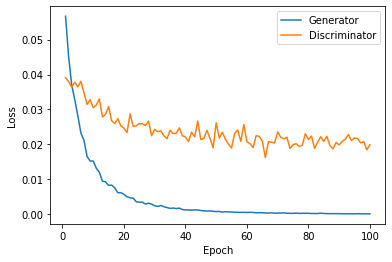

In [ ]:
fig, ax = plt.subplots()
# 損失の推移を描画する。
# ax.plot(history["epoch"], history["G_loss"], label="Generator")
ax.plot(history["epoch"], history["G_loss"], label="Generator")
ax.plot(history["epoch"], history["D_loss"], label="Discriminator")
ax.set_xlabel("Epoch")
ax.set_ylabel("Loss")
ax.legend()
plt.show()
fig.savefig("../GAN+classifier/loss/loss.png", facecolor="white")

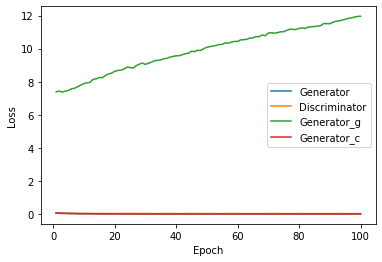

In [ ]:
fig, ax = plt.subplots()
# 損失の推移を描画する。
# ax.plot(history["epoch"], history["G_loss"], label="Generator")
ax.plot(history["epoch"], history["G_loss"], label="Generator")
ax.plot(history["epoch"], history["D_loss"], label="Discriminator")
ax.plot(history["epoch"], history["g_loss"], label="Generator_g")
ax.plot(history["epoch"], history["c_loss"], label="Generator_c")
ax.set_xlabel("Epoch")
ax.set_ylabel("Loss")
ax.legend()
plt.show()
fig.savefig("../GAN+classifier/loss/all_loss.png", facecolor="white")

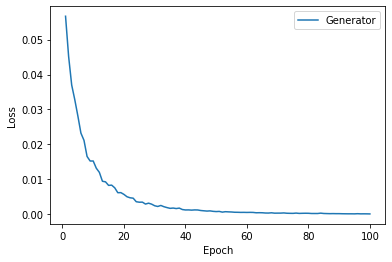

In [ ]:
fig, ax = plt.subplots()
# 損失の推移を描画する。
# ax.plot(history["epoch"], history["G_loss"], label="Generator")
ax.plot(history["epoch"], history["G_loss"], label="Generator")
ax.set_xlabel("Epoch")
ax.set_ylabel("Loss")
ax.legend()
plt.show()
fig.savefig("../GAN+classifier/loss/G_loss.png", facecolor="white")

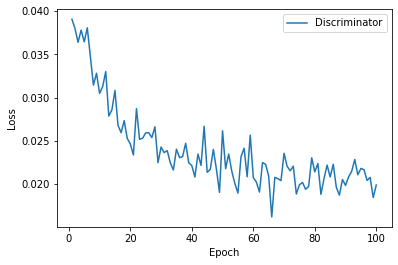

In [ ]:
fig, ax = plt.subplots()
# 損失の推移を描画する。
# ax.plot(history["epoch"], history["G_loss"], label="Generator")
ax.plot(history["epoch"], history["D_loss"], label="Discriminator")
ax.set_xlabel("Epoch")
ax.set_ylabel("Loss")
ax.legend()
plt.show()
fig.savefig("../GAN+classifier/loss/D_loss.png", facecolor="white")

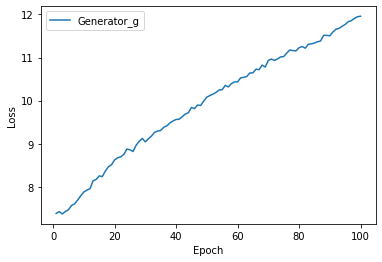

In [ ]:
fig, ax = plt.subplots()
# 損失の推移を描画する。
# ax.plot(history["epoch"], history["G_loss"], label="Generator")
ax.plot(history["epoch"], history["g_loss"], label="Generator_g")
ax.set_xlabel("Epoch")
ax.set_ylabel("Loss")
ax.legend()
plt.show()
fig.savefig("../GAN+classifier/loss/g_loss.png", facecolor="white")

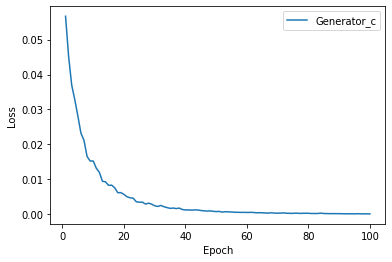

In [ ]:
fig, ax = plt.subplots()
# 損失の推移を描画する。
# ax.plot(history["epoch"], history["G_loss"], label="Generator")
ax.plot(history["epoch"], history["c_loss"], label="Generator_c")
ax.set_xlabel("Epoch")
ax.set_ylabel("Loss")
ax.legend()
plt.show()
fig.savefig("../GAN+classifier/loss/c_loss.png", facecolor="white")

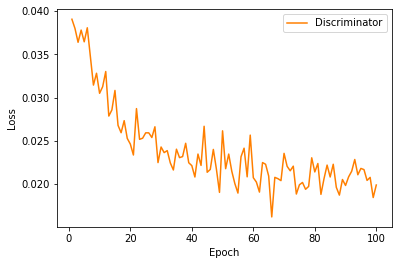

In [ ]:
plt.plot(history["epoch"], history["D_loss"], color='#ff7f00',label="Discriminator")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.savefig("../GAN+attack_r_only_max/loss/D_loss2.png", facecolor="white")
plt.show()

## - Show Generating Images

In [ ]:
# for i in range(1, 101):    
#     z = Variable(torch.randn(26 * 26, z_size, 1, 1)).to(device)

#     # Labels 0 ~ 9
#     labels = Variable(torch.LongTensor([i for _ in range(class_num) for i in range(class_num)])).to(device)

#     generator.load_state_dict(torch.load("../GAN+attack_r_only_max/model/{}.pth".format(i), map_location='cpu'))

#     # Generating images
#     sample_images = generator(z, labels)

#     reg_list = []
#     false = 0
#     for image, label in zip(sample_images, labels):
#         image, label = image.unsqueeze(0).to(device), label.unsqueeze(0).type(torch.LongTensor).to(device)

#         # データをモデルに順伝播させます
#         output = cmodel(image)
#         init_pred = output.max(1, keepdim=True)[1] # 最大の確率のインデックスを取得します。

#         # 最初から予測が間違っている場合、攻撃する必要がないため次のイテレーションに進みます。
        
#         if init_pred.item() != label.item():
#             false += 1
#             continue

#         reg_list.append(model_list[label.item()](image).item())

#         if len(reg_list) == 500:
#             break

#     # print(reg_list)
#     print("{}:{}".format(i, np.mean(reg_list)))